<a href="https://colab.research.google.com/github/ankshah131/localsolve-open/blob/main/wildfires/la_wildfires/VegetationAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [24]:
import ee

In [25]:
ee.Authenticate()

In [26]:

import geemap
import geemap.plot as plot

In [27]:
ee.Initialize(project='localsolve')

In [28]:
map = geemap.Map()
map.setCenter(-118.288105,34.172376,10)

In [29]:
burn_severity = ee.Image('projects/localsolve/assets/los_angeles_fires/dNBR_Classified_Jan_2025')

In [30]:
# Visualization parameters for burn severity
burn_vis = {
    'min': 1,
    'max': 7,
    'palette': ['black', 'brown', 'red', 'orange', 'yellow', 'lightgreen', 'green']
}

# Add the burn severity layer to the map
map.addLayer(burn_severity, burn_vis, 'Burn Severity')

In [31]:
map

Map(center=[34.172376, -118.288105], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=Se…

In [ ]:
burn_severity.getInfo()

{'type': 'Image',
 'bands': [{'id': 'sum',
   'data_type': {'type': 'PixelType',
    'precision': 'int',
    'min': -2147483648,
    'max': 2147483647},
   'dimensions': [9005, 6763],
   'crs': 'EPSG:4326',
   'crs_transform': [8.983152841195215e-05,
    0,
    -118.72431238967356,
    0,
    -8.983152841195215e-05,
    34.61083025572739]}],
 'version': 1738339064700101,
 'id': 'projects/localsolve/assets/los_angeles_fires/dNBR_Classified_Jan_2025',
 'properties': {'system:footprint': {'type': 'LinearRing',
   'coordinates': [[-117.91542445169891, 34.003254541479684],
    [-117.91531583608948, 34.00332416923964],
    [-117.91531503152916, 34.610875296781536],
    [-118.01652974568943, 34.61087537454397],
    [-118.1176351591692, 34.610875324311046],
    [-118.21874055692312, 34.61087531489582],
    [-118.31984589150204, 34.61087533945753],
    [-118.4209512920667, 34.61087534395537],
    [-118.5220567074894, 34.610875316868174],
    [-118.62316208491085, 34.61087532212083],
    [-118.7

In [32]:
asset_id_veg = 'projects/localsolve/assets/los_angeles_fires/Santa_Monica_Vegetation_Map'
veg = ee.FeatureCollection(asset_id_veg)

In [ ]:
first_feature = trees.first()
column_names = first_feature.propertyNames()
print(column_names.getInfo())

['LU_Code', 'LU_Text', 'UTDensity', 'Density', 'OBJECTID', 'Class_Cnam', 'AAdb_ID', 'Map_Class', 'Class_Abbr', 'Shape_Area', 'Class_Snam', 'Shape_Length', 'system:index']


In [33]:
asset_id_fire_perimeter = 'projects/localsolve/assets/los_angeles_fires/merged_perimeters_Jan_2025'
fire_perimeter = ee.FeatureCollection(asset_id_fire_perimeter)

In [34]:
map.addLayer(veg, {}, 'Vegetation')
map.addLayer(fire_perimeter, {}, 'Fire perimeter')

In [35]:
subset_veg = veg.filterBounds(fire_perimeter)

In [36]:
map.addLayer(subset_veg, {}, 'Filtered Vegetation')

In [37]:
subset_veg.getInfo()

{'type': 'FeatureCollection',
 'columns': {'AAdb_ID': 'String',
  'Class_Abbr': 'String',
  'Class_Cnam': 'String',
  'Class_Snam': 'String',
  'Density': 'Integer',
  'LU_Code': 'Integer',
  'LU_Text': 'String',
  'Map_Class': 'Integer',
  'OBJECTID': 'Integer',
  'Shape_Area': 'Float',
  'Shape_Length': 'Float',
  'UTDensity': 'Integer',
  'system:index': 'String'},
 'version': 1738192898483008,
 'id': 'projects/localsolve/assets/los_angeles_fires/Santa_Monica_Vegetation_Map',
 'properties': {'system:asset_size': 29940656},
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-118.54081438673664, 34.07504905187847],
      [-118.54079675072667, 34.07496869991049],
      [-118.54073538096009, 34.074844150954185],
      [-118.54058725616036, 34.07468485887194],
      [-118.54019872853982, 34.07432270238591],
      [-118.54002833546238, 34.07411886284907],
      [-118.5398593673484, 34.07400016939481],
      [-118.53977074140985, 34.07385799907761],


In [43]:
# Map an area calculation function over the FeatureCollection.
subset_veg_area = subset_veg.map(
    lambda feature: feature.set(
        {'clipped_area': feature.geometry().area()}
    )
)

subset_veg_area.getInfo()

{'type': 'FeatureCollection',
 'columns': {'AAdb_ID': 'String',
  'Class_Abbr': 'String',
  'Class_Cnam': 'String',
  'Class_Snam': 'String',
  'Density': 'Integer',
  'LU_Code': 'Integer',
  'LU_Text': 'String',
  'Map_Class': 'Integer',
  'OBJECTID': 'Integer',
  'Shape_Area': 'Float',
  'Shape_Length': 'Float',
  'UTDensity': 'Integer',
  'clipped_area': 'Float',
  'system:index': 'String'},
 'version': 1738192898483008,
 'id': 'projects/localsolve/assets/los_angeles_fires/Santa_Monica_Vegetation_Map',
 'properties': {'system:asset_size': 29940656},
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-118.54081438673664, 34.07504905187847],
      [-118.54079675072667, 34.07496869991049],
      [-118.54073538096009, 34.074844150954185],
      [-118.54058725616036, 34.07468485887194],
      [-118.54019872853982, 34.07432270238591],
      [-118.54002833546238, 34.07411886284907],
      [-118.5398593673484, 34.07400016939481],
      [-118.539770741

In [44]:
# Extract values at regions
sampled_data = burn_severity.reduceRegions(
    collection=subset_veg_area,
    reducer=ee.Reducer.median(),
    scale=10, # meters
    crs='EPSG:26911',
)

In [45]:
# Export the sampled data to Google Drive (optional)
task = ee.batch.Export.table.toDrive(
    collection=sampled_data,
    description='Vegetationwithburn',
    fileFormat='CSV'
)
task.start()

In [52]:
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point
from shapely.geometry import Polygon

from matplotlib import pyplot as plt
import seaborn as sns

pd.set_option('display.float_format', '{:.2f}'.format)

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [46]:
veg_withburn = pd.read_csv("/content/drive/MyDrive/Vegetationwithburn.csv")
veg_withburn

,system:index,AAdb_ID,Class_Abbr,Class_Cnam,Class_Snam,Density,LU_Code,LU_Text,Map_Class,OBJECTID,Shape_Area,Shape_Length,UTDensity,clipped_area,median,.geo
0,00000000000000002456,samo2298,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,48666,54104.373755,3934.198149,9,54131.006172,2.0,"{""type"":""Polygon"",""coordinates"":[[[-118.540814..."
1,00000000000000002539,samo2635,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,48991,21036.519029,1037.335632,9,21053.667257,4.0,"{""type"":""Polygon"",""coordinates"":[[[-118.595287..."
2,00000000000000002566,samo2687,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,49044,5602.800364,505.273578,9,5607.997987,2.0,"{""type"":""Polygon"",""coordinates"":[[[-118.639310..."
3,00000000000000002651,NaN,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,7,28037.670887,1553.053573,9,28082.753052,2.0,"{""type"":""Polygon"",""coordinates"":[[[-118.568817..."
4,00000000000000002652,NaN,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,9,5308.169936,395.125594,9,5317.654981,2.0,"{""type"":""Polygon"",""coordinates"":[[[-118.556288..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3892,00000000000000001fbb,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47076,30926.979170,1886.137064,9,30939.251615,4.0,"{""type"":""Polygon"",""coordinates"":[[[-118.524206..."
3893,00000000000000001fc3,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47085,17616.545565,1367.115057,9,17617.415866,4.0,"{""type"":""Polygon"",""coordinates"":[[[-118.511771..."
3894,00000000000000001fc4,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47086,6993.112630,625.453264,9,6994.079817,4.0,"{""type"":""Polygon"",""coordinates"":[[[-118.528604..."
3895,00000000000000001fc7,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47090,9874.557927,776.881646,9,9847.904525,5.0,"{""type"":""Polygon"",""coordinates"":[[[-118.537262..."


In [49]:
veg_withburn['BurnSeverity'] = veg_withburn['median'].astype(int)
veg_withburn['BurnSeverity'].value_counts()

,count
BurnSeverity,
2,1527
1,1070
3,550
4,511
5,238
6,1


In [53]:
veg_withburn.groupby(['Class_Cnam'])['clipped_area'].sum()

,clipped_area
Class_Cnam,
(California Walnut)/Undifferentiated Tall Shrubs Shrubland Mapping Unit,54457.83
Arroyo Willow Woodland/Forest Alliance,5175.84
Artificial cuts/Embankments Undifferentiated Vegetation Mapping Unit,1042773.45
Ashy Buckwheat Shrubland Alliance,363647.79
Beach Sand Mapping Unit,919191.28
...,...
Urban/Disturbed or Built-up Undifferentiated Mapping Unit,18259563.48
Valley Oak Woodland/Forest Alliance,590100.47
Water Mapping Unit,36853.62


In [50]:
veg_withburn.groupby(['Class_Cnam','BurnSeverity'])['clipped_area'].sum()


Class_Cnam                                                               BurnSeverity
(California Walnut)/Undifferentiated Tall Shrubs Shrubland Mapping Unit  1                34846.734148
                                                                         2                19611.091870
Arroyo Willow Woodland/Forest Alliance                                   4                 5175.843316
Artificial cuts/Embankments Undifferentiated Vegetation Mapping Unit     1                90916.432291
                                                                         2               231056.191022
                                                                                             ...      
Willow Woodland/Forest Superalliance                                     1                82099.477813
                                                                         2                44778.442754
                                                                         3                34407.733147
                                                                         4                51158.986741
                                                                         5                20685.273149
Name: clipped_area, Length: 205, dtype: float64

In [54]:
byseverity = veg_withburn.groupby(['Class_Cnam','BurnSeverity'])['clipped_area'].sum().reset_index()
byseverity = byseverity.sort_values('clipped_area', ascending=False)
byseverity

,Class_Cnam,BurnSeverity,clipped_area
17,Big Pod Ceanothus Shrubland Alliance,2,12419897.63
16,Big Pod Ceanothus Shrubland Alliance,1,12288817.96
136,Laurel Sumac Shrubland Alliance,2,10804565.20
190,Urban/Disturbed or Built-up Undifferentiated M...,4,10434608.94
125,Greenbark Ceanothus Shrubland Alliance,1,8852372.17
...,...,...,...
195,Water Mapping Unit,3,4127.28
145,Mexican Elderberry Shrubland Alliance,2,4112.34
173,Scrub Oak Shrubland Alliance,2,3785.97
34,Black Sage-California Sagebrush Shrubland Alli...,2,3475.31


In [58]:
byseverity['clipped_area_ha'] = byseverity['clipped_area'] * 0.0001

In [71]:
byseverity['name_split'] = byseverity['Class_Cnam'].str.rpartition()[0]
byseverity['Veg_name'] = byseverity['name_split'].str.rpartition()[0]
byseverity

,Class_Cnam,BurnSeverity,clipped_area,clipped_area_ha,Veg_name,name_split
17,Big Pod Ceanothus Shrubland Alliance,2,12419897.63,1241.99,Big Pod Ceanothus,Big Pod Ceanothus Shrubland
16,Big Pod Ceanothus Shrubland Alliance,1,12288817.96,1228.88,Big Pod Ceanothus,Big Pod Ceanothus Shrubland
136,Laurel Sumac Shrubland Alliance,2,10804565.20,1080.46,Laurel Sumac,Laurel Sumac Shrubland
190,Urban/Disturbed or Built-up Undifferentiated M...,4,10434608.94,1043.46,Urban/Disturbed or Built-up Undifferentiated,Urban/Disturbed or Built-up Undifferentiated M...
125,Greenbark Ceanothus Shrubland Alliance,1,8852372.17,885.24,Greenbark Ceanothus,Greenbark Ceanothus Shrubland
...,...,...,...,...,...,...
195,Water Mapping Unit,3,4127.28,0.41,Water,Water Mapping
145,Mexican Elderberry Shrubland Alliance,2,4112.34,0.41,Mexican Elderberry,Mexican Elderberry Shrubland
173,Scrub Oak Shrubland Alliance,2,3785.97,0.38,Scrub Oak,Scrub Oak Shrubland
34,Black Sage-California Sagebrush Shrubland Alli...,2,3475.31,0.35,Black Sage-California Sagebrush,Black Sage-California Sagebrush Shrubland


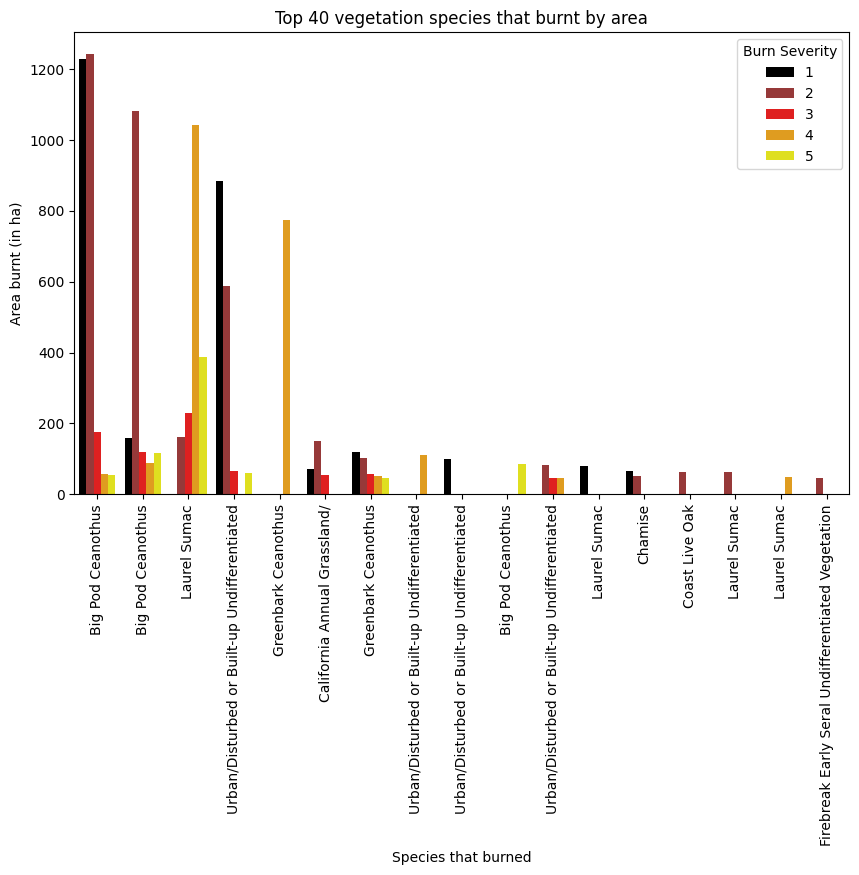

In [79]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# use the scatterplot() function
sns.barplot(
    x="Veg_name", # the x column
    y="clipped_area_ha", # the y column
    hue="BurnSeverity", # the third dimension (color)
    data=byseverity[:40],# pass in the data
    palette=sns.color_palette(['black', 'brown','red','orange','yellow', 'lightgreen', 'green']),
    ax=ax
)

# Format with matplotlib commands
ax.set_xlabel("Species that burned")
ax.set_ylabel("Area burnt (in ha)")
ax.set_title("Top 40 vegetation species that burnt by area")
#ax.set_xticks(byseverity['Class_Cnam'][:20])
ax.set_xticklabels(byseverity['Veg_name'][:20], rotation=90)
# Change legend labels
ax.legend(title='Burn Severity', loc='upper right')

In [81]:
burn = []

for index, row in veg_withburn.iterrows():
  if row['BurnSeverity'] == 0:
    burn.append('N/A')
  elif row['BurnSeverity'] == 1 or row['BurnSeverity'] == 2 or row['BurnSeverity'] == 3 or row['BurnSeverity'] == 4:
    burn.append('Burnt')
  else:
    burn.append('Not Burnt')

veg_withburn['dNBR_Classification'] = burn

In [82]:
from collections import Counter
Counter(burn)

Counter({'Burnt': 3658, 'Not Burnt': 239})

In [93]:
proportion_burn = veg_withburn.groupby(['Class_Cnam','dNBR_Classification'])['clipped_area'].sum().reset_index()
proportion_burn

,Class_Cnam,dNBR_Classification,clipped_area
0,(California Walnut)/Undifferentiated Tall Shru...,Burnt,54457.83
1,Arroyo Willow Woodland/Forest Alliance,Burnt,5175.84
2,Artificial cuts/Embankments Undifferentiated V...,Burnt,893536.37
3,Artificial cuts/Embankments Undifferentiated V...,Not Burnt,149237.08
4,Ashy Buckwheat Shrubland Alliance,Burnt,363647.79
...,...,...,...
92,Water Mapping Unit,Burnt,8739.09
93,Water Mapping Unit,Not Burnt,28114.53
94,White Alder Woodland/Forest Alliance,Burnt,136740.05
95,Willow Woodland/Forest Superalliance,Burnt,212444.64


In [103]:
df_wide = proportion_burn.pivot(index='Class_Cnam', columns='dNBR_Classification', values='clipped_area').reset_index()
df_wide.index.names = ['index']

df_wide

dNBR_Classification,Class_Cnam,Burnt,Not Burnt
index,,,
0,(California Walnut)/Undifferentiated Tall Shru...,54457.83,NaN
1,Arroyo Willow Woodland/Forest Alliance,5175.84,NaN
2,Artificial cuts/Embankments Undifferentiated V...,893536.37,149237.08
3,Ashy Buckwheat Shrubland Alliance,363647.79,NaN
4,Beach Sand Mapping Unit,69850.20,849341.08
...,...,...,...
58,Urban/Disturbed or Built-up Undifferentiated M...,14374018.19,3885545.29
59,Valley Oak Woodland/Forest Alliance,505765.54,84334.93
60,Water Mapping Unit,8739.09,28114.53


In [104]:
df_wide.columns

Index(['Class_Cnam', 'Burnt', 'Not Burnt'], dtype='object', name='dNBR_Classification')

In [105]:
df_wide['Not Burnt'] = df_wide['Not Burnt'].fillna(0)
df_wide['Burnt'] = df_wide['Burnt'].fillna(0)
df_wide['Total Area'] = df_wide['Burnt'] + df_wide['Not Burnt']
df_wide['Proportion of area that burnt'] = df_wide['Burnt'] / df_wide['Total Area']
df_wide = df_wide.sort_values('Proportion of area that burnt', ascending=False)
df_wide

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt
index,,,,,
0,(California Walnut)/Undifferentiated Tall Shru...,54457.83,0.00,54457.83,1.00
42,Mexican Elderberry Shrubland Alliance,53714.76,0.00,53714.76,1.00
29,Coyote Brush Shrubland Alliance,85397.29,0.00,85397.29,1.00
1,Arroyo Willow Woodland/Forest Alliance,5175.84,0.00,5175.84,1.00
32,Fennel Herbaceous Alliance,10752.69,0.00,10752.69,1.00
...,...,...,...,...,...
25,Chamise-Black Sage Shrubland Alliance,179945.36,67477.00,247422.36,0.73
60,Water Mapping Unit,8739.09,28114.53,36853.62,0.24
55,Scrub Oak-Chamise Shrubland Alliance,21699.07,192079.11,213778.18,0.10


In [108]:
species_thatburnedcompletely = df_wide[df_wide['Proportion of area that burnt'] == 1.00]
species_thatburnedcompletely = species_thatburnedcompletely.sort_values('Burnt', ascending=False)
species_thatburnedcompletely

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt
index,,,,,
15,California Bay Woodland/Forest Alliance,1592251.88,0.00,1592251.88,1.00
56,Toyon Shrubland Alliance,850295.55,0.00,850295.55,1.00
41,Lemonade Berry Shrubland Alliance,452325.73,0.00,452325.73,1.00
3,Ashy Buckwheat Shrubland Alliance,363647.79,0.00,363647.79,1.00
27,Cleared Land Mapping Unit,200559.37,0.00,200559.37,1.00
61,White Alder Woodland/Forest Alliance,136740.05,0.00,136740.05,1.00
48,Quail Bush Shrubland Alliance,118580.41,0.00,118580.41,1.00
37,Hairy Leaf Ceanothus Shrubland Alliance,117134.39,0.00,117134.39,1.00
24,Chamise-Big Berry Manzanita Shrubland Alliance,115871.42,0.00,115871.42,1.00


In [112]:
species_thatburnedcompletely['name_split'] = species_thatburnedcompletely['Class_Cnam'].str.rpartition()[0]
species_thatburnedcompletely['Veg_name'] = species_thatburnedcompletely['name_split'].str.rpartition()[0]
species_thatburnedcompletely['Burnt_ha'] = species_thatburnedcompletely['Burnt'] * 0.0001
species_thatburnedcompletely

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt,name_split,Veg_name,Burnt_ha
index,,,,,,,,
15,California Bay Woodland/Forest Alliance,1592251.88,0.00,1592251.88,1.00,California Bay Woodland/Forest,California Bay,159.23
56,Toyon Shrubland Alliance,850295.55,0.00,850295.55,1.00,Toyon Shrubland,Toyon,85.03
41,Lemonade Berry Shrubland Alliance,452325.73,0.00,452325.73,1.00,Lemonade Berry Shrubland,Lemonade Berry,45.23
3,Ashy Buckwheat Shrubland Alliance,363647.79,0.00,363647.79,1.00,Ashy Buckwheat Shrubland,Ashy Buckwheat,36.36
27,Cleared Land Mapping Unit,200559.37,0.00,200559.37,1.00,Cleared Land Mapping,Cleared Land,20.06
61,White Alder Woodland/Forest Alliance,136740.05,0.00,136740.05,1.00,White Alder Woodland/Forest,White Alder,13.67
48,Quail Bush Shrubland Alliance,118580.41,0.00,118580.41,1.00,Quail Bush Shrubland,Quail Bush,11.86
37,Hairy Leaf Ceanothus Shrubland Alliance,117134.39,0.00,117134.39,1.00,Hairy Leaf Ceanothus Shrubland,Hairy Leaf Ceanothus,11.71
24,Chamise-Big Berry Manzanita Shrubland Alliance,115871.42,0.00,115871.42,1.00,Chamise-Big Berry Manzanita Shrubland,Chamise-Big Berry Manzanita,11.59


[Text(0, 0, 'California Bay'),
 Text(1, 0, 'Toyon'),
 Text(2, 0, 'Lemonade Berry'),
 Text(3, 0, 'Ashy Buckwheat'),
 Text(4, 0, 'Cleared Land'),
 Text(5, 0, 'White Alder'),
 Text(6, 0, 'Quail Bush'),
 Text(7, 0, 'Hairy Leaf Ceanothus'),
 Text(8, 0, 'Chamise-Big Berry Manzanita'),
 Text(9, 0, 'Coyote Brush'),
 Text(10, 0, 'Giant Wild Rye'),
 Text(11, 0, 'Scrub Oak'),
 Text(12, 0, 'Poison Oak'),
 Text(13, 0, '(California Walnut)/Undifferentiated Tall Shrubs Shrubland'),
 Text(14, 0, 'Mexican Elderberry'),
 Text(15, 0, 'Eastwood Manzanita'),
 Text(16, 0, 'Landslide'),
 Text(17, 0, 'Black Sage-California Sagebrush'),
 Text(18, 0, 'Big Berry Manzanita'),
 Text(19, 0, 'Post-fire and Post-clearance Shrub Regeneration'),
 Text(20, 0, 'California Sagebrush-California Buckwheat'),
 Text(21, 0, 'Mule Fat'),
 Text(22, 0, 'Giant Reed'),
 Text(23, 0, 'Scrub Oak-Birch Leaf Mountain Mahogany'),
 Text(24, 0, 'Holly Leaf Cherry'),
 Text(25, 0, 'Fennel'),
 Text(26, 0, 'Rocky Streambed'),
 Text(27, 0, "Pal

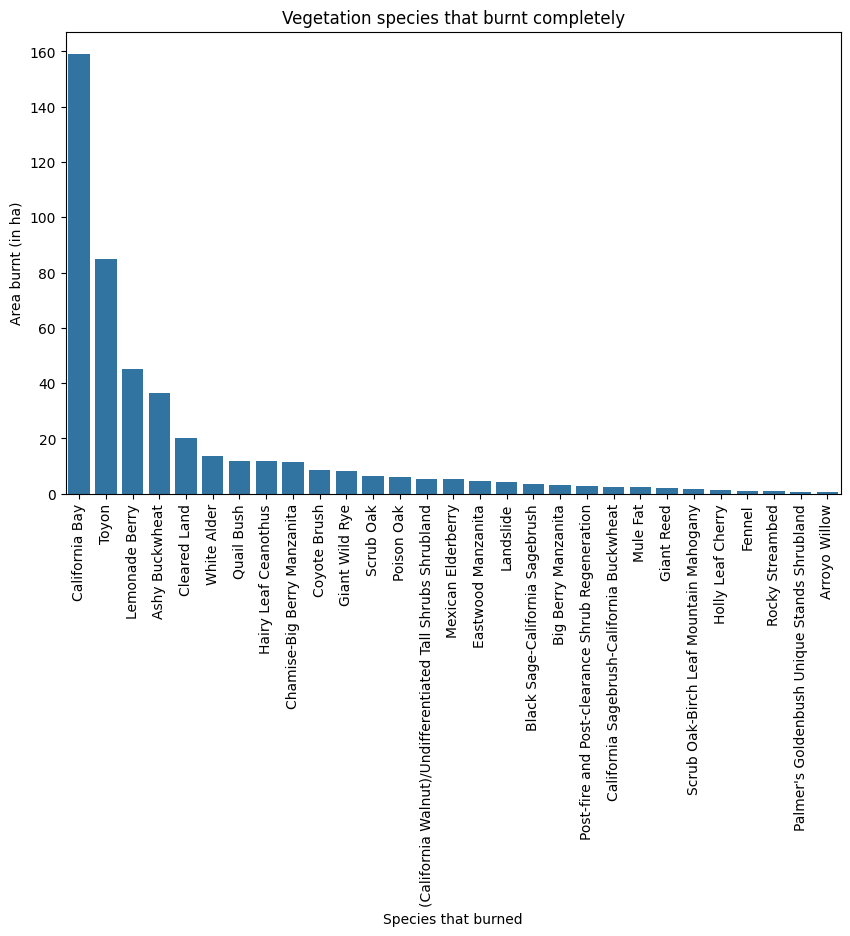

In [117]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# use the scatterplot() function
sns.barplot(
    x="Veg_name", # the x column
    y="Burnt_ha", # the y column
    data=species_thatburnedcompletely,# pass in the data
    ax=ax
)

# Format with matplotlib commands
ax.set_xlabel("Species that burned")
ax.set_ylabel("Area burnt (in ha)")
ax.set_title("Vegetation species that burnt completely")
#ax.set_xticks(byseverity['Class_Cnam'][:20])
ax.set_xticklabels(species_thatburnedcompletely['Veg_name'], rotation=90)

## Lets try with buffer

In [118]:
# Define a function to create a buffer around a feature
def buffer_feature(feature):
    return feature.buffer(1000)  # 10km buffer

# Apply the buffer function to each feature in the collection
fire_perimeter_buffered = fire_perimeter.map(buffer_feature)

# Add the buffered feature collection to the map
map.addLayer(fire_perimeter_buffered, {"color": "red"}, "Buffered Fire perimeters")


In [119]:
subset_veg_buffer = veg.filterBounds(fire_perimeter_buffered)
map.addLayer(subset_veg_buffer, {}, 'Vegetation in buffer')

In [121]:
# Map an area calculation function over the FeatureCollection.
subset_veg_buffer_area = subset_veg_buffer.map(
    lambda feature: feature.set(
        {'clipped_area': feature.geometry().area()}
    )
)

In [122]:
# Extract values at regions
sampled_data2 = burn_severity.reduceRegions(
    collection=subset_veg_buffer_area,
    reducer=ee.Reducer.median(),
    scale=10, # meters
    crs='EPSG:26911',
)

In [123]:
# Export the sampled data to Google Drive (optional)
task = ee.batch.Export.table.toDrive(
    collection=sampled_data2,
    description='Vegetationwithburn_withbuffer',
    fileFormat='CSV'
)
task.start()

In [124]:
veg_withburn_buffer = pd.read_csv("/content/drive/MyDrive/Vegetationwithburn_withbuffer.csv")
veg_withburn_buffer

,system:index,AAdb_ID,Class_Abbr,Class_Cnam,Class_Snam,Density,LU_Code,LU_Text,Map_Class,OBJECTID,Shape_Area,Shape_Length,UTDensity,clipped_area,median,.geo
0,00000000000000002456,samo2298,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,48666,54104.37,3934.20,9,54131.01,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.540814..."
1,00000000000000002539,samo2635,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,48991,21036.52,1037.34,9,21053.67,4.00,"{""type"":""Polygon"",""coordinates"":[[[-118.595287..."
2,00000000000000002566,samo2687,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,49044,5602.80,505.27,9,5608.00,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.639310..."
3,00000000000000002651,NaN,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,7,28037.67,1553.05,9,28082.75,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.568817..."
4,00000000000000002652,NaN,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,9,5308.17,395.13,9,5317.65,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.556288..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6322,00000000000000001fc7,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47090,9874.56,776.88,9,9847.90,5.00,"{""type"":""Polygon"",""coordinates"":[[[-118.537262..."
6323,00000000000000001fd5,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,5,3100,Vacant Undifferentiated,97000,47106,11598.61,723.03,9,11593.94,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.632960..."
6324,00000000000000001fd6,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,5,3100,Vacant Undifferentiated,97000,47107,30686.22,2608.66,9,30646.05,5.00,"{""type"":""Polygon"",""coordinates"":[[[-118.342266..."
6325,00000000000000001fda,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,9,3100,Vacant Undifferentiated,97000,47111,7890.28,742.66,9,7902.46,5.00,"{""type"":""Polygon"",""coordinates"":[[[-118.639120..."


In [125]:
veg_withburn_buffer['BurnSeverity'] = veg_withburn_buffer['median'].astype(int)
veg_withburn_buffer['BurnSeverity'].value_counts()

,count
BurnSeverity,
5,2358
2,1620
1,1092
4,648
3,603
6,6


In [126]:
veg_withburn_buffer.groupby(['Class_Cnam'])['clipped_area'].sum()

,clipped_area
Class_Cnam,
(California Walnut)/Undifferentiated Tall Shrubs Shrubland Mapping Unit,88414.49
Agriculture Mapping Unit,19409.42
Arroyo Willow Woodland/Forest Alliance,22325.75
Artificial cuts/Embankments Undifferentiated Vegetation Mapping Unit,2210916.47
Ashy Buckwheat Shrubland Alliance,440781.28
...,...
Water Mapping Unit,45788.81
Wedge Leaf Ceanothus Shrubland Alliance,26493.78
Wetland Undifferentiated Superalliance,10693.65


In [127]:
veg_withburn_buffer.groupby(['Class_Cnam','BurnSeverity'])['clipped_area'].sum()


Class_Cnam                                                               BurnSeverity
(California Walnut)/Undifferentiated Tall Shrubs Shrubland Mapping Unit  1               34846.73
                                                                         2               19611.09
                                                                         5               33956.67
Agriculture Mapping Unit                                                 5               19409.42
Arroyo Willow Woodland/Forest Alliance                                   4                5175.84
                                                                                           ...   
Willow Woodland/Forest Superalliance                                     1               82099.48
                                                                         2               44778.44
                                                                         3               34407.73
                                                                         4               51158.99
                                                                         5              241275.62
Name: clipped_area, Length: 244, dtype: float64

In [128]:
byseverity2 = veg_withburn_buffer.groupby(['Class_Cnam','BurnSeverity'])['clipped_area'].sum().reset_index()
byseverity2 = byseverity2.sort_values('clipped_area', ascending=False)
byseverity2

,Class_Cnam,BurnSeverity,clipped_area
225,Urban/Disturbed or Built-up Undifferentiated M...,4,20119918.79
226,Urban/Disturbed or Built-up Undifferentiated M...,5,18733064.77
59,California Annual Grassland/ Herbaceous Alliance,4,14945467.91
21,Big Pod Ceanothus Shrubland Alliance,2,12597762.37
20,Big Pod Ceanothus Shrubland Alliance,1,12300046.37
...,...,...,...
155,Landslide Mapping Unit,1,4270.97
231,Water Mapping Unit,3,4127.28
169,Mexican Elderberry Shrubland Alliance,2,4112.34
40,Black Sage-California Sagebrush Shrubland Alli...,2,3475.31


In [129]:
byseverity2['clipped_area_ha'] = byseverity2['clipped_area'] * 0.0001

In [130]:
byseverity2['name_split'] = byseverity2['Class_Cnam'].str.rpartition()[0]
byseverity2['Veg_name'] = byseverity2['name_split'].str.rpartition()[0]
byseverity2

,Class_Cnam,BurnSeverity,clipped_area,clipped_area_ha,name_split,Veg_name
225,Urban/Disturbed or Built-up Undifferentiated M...,4,20119918.79,2011.99,Urban/Disturbed or Built-up Undifferentiated M...,Urban/Disturbed or Built-up Undifferentiated
226,Urban/Disturbed or Built-up Undifferentiated M...,5,18733064.77,1873.31,Urban/Disturbed or Built-up Undifferentiated M...,Urban/Disturbed or Built-up Undifferentiated
59,California Annual Grassland/ Herbaceous Alliance,4,14945467.91,1494.55,California Annual Grassland/ Herbaceous,California Annual Grassland/
21,Big Pod Ceanothus Shrubland Alliance,2,12597762.37,1259.78,Big Pod Ceanothus Shrubland,Big Pod Ceanothus
20,Big Pod Ceanothus Shrubland Alliance,1,12300046.37,1230.00,Big Pod Ceanothus Shrubland,Big Pod Ceanothus
...,...,...,...,...,...,...
155,Landslide Mapping Unit,1,4270.97,0.43,Landslide Mapping,Landslide
231,Water Mapping Unit,3,4127.28,0.41,Water Mapping,Water
169,Mexican Elderberry Shrubland Alliance,2,4112.34,0.41,Mexican Elderberry Shrubland,Mexican Elderberry
40,Black Sage-California Sagebrush Shrubland Alli...,2,3475.31,0.35,Black Sage-California Sagebrush Shrubland,Black Sage-California Sagebrush


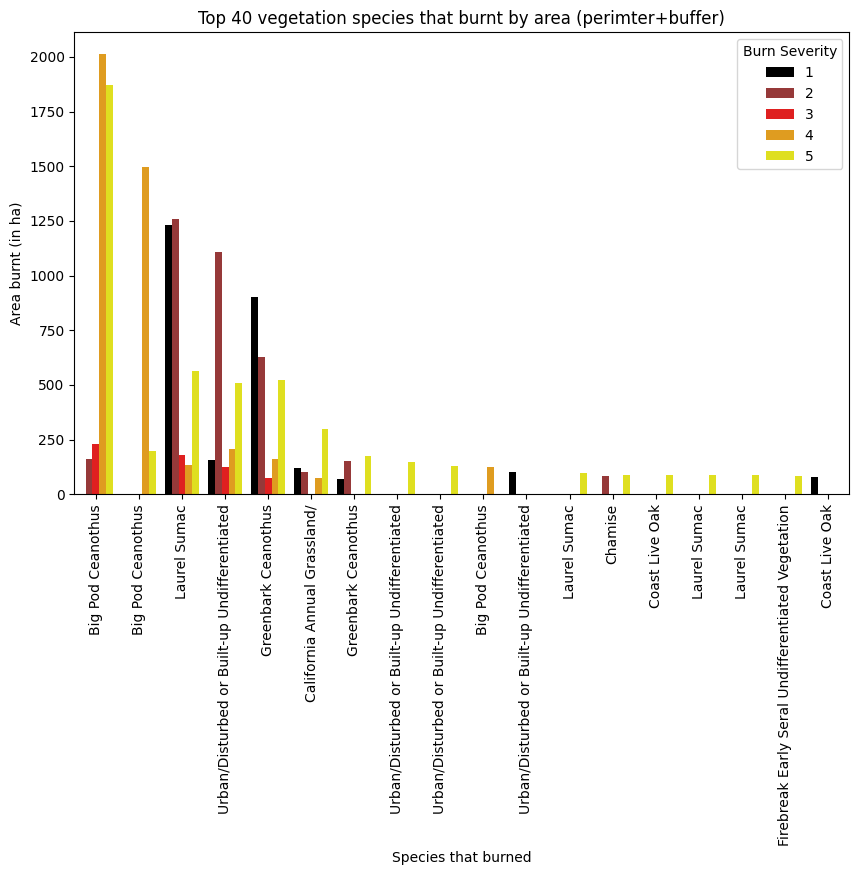

In [131]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# use the scatterplot() function
sns.barplot(
    x="Veg_name", # the x column
    y="clipped_area_ha", # the y column
    hue="BurnSeverity", # the third dimension (color)
    data=byseverity2[:40],# pass in the data
    palette=sns.color_palette(['black', 'brown','red','orange','yellow', 'lightgreen', 'green']),
    ax=ax
)

# Format with matplotlib commands
ax.set_xlabel("Species that burned")
ax.set_ylabel("Area burnt (in ha)")
ax.set_title("Top 40 vegetation species that burnt by area (perimter+buffer)")
#ax.set_xticks(byseverity['Class_Cnam'][:20])
ax.set_xticklabels(byseverity['Veg_name'][:20], rotation=90)
# Change legend labels
ax.legend(title='Burn Severity', loc='upper right')

In [132]:
burn2 = []

for index, row in veg_withburn_buffer.iterrows():
  if row['BurnSeverity'] == 0:
    burn2.append('N/A')
  elif row['BurnSeverity'] == 1 or row['BurnSeverity'] == 2 or row['BurnSeverity'] == 3 or row['BurnSeverity'] == 4:
    burn2.append('Burnt')
  else:
    burn2.append('Not Burnt')

veg_withburn_buffer['dNBR_Classification'] = burn2

In [133]:
from collections import Counter
Counter(burn2)

Counter({'Burnt': 3963, 'Not Burnt': 2364})

In [134]:
proportion_burn2 = veg_withburn_buffer.groupby(['Class_Cnam','dNBR_Classification'])['clipped_area'].sum().reset_index()
proportion_burn2

,Class_Cnam,dNBR_Classification,clipped_area
0,(California Walnut)/Undifferentiated Tall Shru...,Burnt,54457.83
1,(California Walnut)/Undifferentiated Tall Shru...,Not Burnt,33956.67
2,Agriculture Mapping Unit,Not Burnt,19409.42
3,Arroyo Willow Woodland/Forest Alliance,Burnt,5175.84
4,Arroyo Willow Woodland/Forest Alliance,Not Burnt,17149.91
...,...,...,...
119,Wetland Undifferentiated Superalliance,Not Burnt,10693.65
120,White Alder Woodland/Forest Alliance,Burnt,136740.05
121,White Alder Woodland/Forest Alliance,Not Burnt,10895.37
122,Willow Woodland/Forest Superalliance,Burnt,212444.64


In [138]:
df_wide2 = proportion_burn2.pivot(index='Class_Cnam', columns='dNBR_Classification', values='clipped_area').reset_index()
df_wide2.index.names = ['index']

df_wide2

dNBR_Classification,Class_Cnam,Burnt,Not Burnt
index,,,
0,(California Walnut)/Undifferentiated Tall Shru...,54457.83,33956.67
1,Agriculture Mapping Unit,NaN,19409.42
2,Arroyo Willow Woodland/Forest Alliance,5175.84,17149.91
3,Artificial cuts/Embankments Undifferentiated V...,910355.30,1300561.18
4,Ashy Buckwheat Shrubland Alliance,363647.79,77133.49
...,...,...,...
64,Water Mapping Unit,17674.28,28114.53
65,Wedge Leaf Ceanothus Shrubland Alliance,NaN,26493.78
66,Wetland Undifferentiated Superalliance,NaN,10693.65


In [139]:
df_wide2['Not Burnt'] = df_wide2['Not Burnt'].fillna(0)
df_wide2['Burnt'] = df_wide2['Burnt'].fillna(0)
df_wide2['Total Area'] = df_wide2['Burnt'] + df_wide2['Not Burnt']
df_wide2['Proportion of area that burnt'] = df_wide2['Burnt'] / df_wide2['Total Area']
df_wide2 = df_wide2.sort_values('Proportion of area that burnt', ascending=False)
df_wide2

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt
index,,,,,
34,Fennel Herbaceous Alliance,10752.69,0.00,10752.69,1.00
55,Rocky Streambed Mapping Unit,8312.82,0.00,8312.82,1.00
42,Landslide Mapping Unit,40626.78,0.00,40626.78,1.00
26,Chamise-Big Berry Manzanita Shrubland Alliance,115871.42,0.00,115871.42,1.00
6,Big Berry Manzanita Shrubland Alliance,30852.92,0.00,30852.92,1.00
...,...,...,...,...,...
66,Wetland Undifferentiated Superalliance,0.00,10693.65,10693.65,0.00
1,Agriculture Mapping Unit,0.00,19409.42,19409.42,0.00
24,Ceanothus-Chamise Shrubland Mapping Unit,0.00,39129.70,39129.70,0.00


In [140]:
species_thatburnedcompletely2 = df_wide2[df_wide2['Proportion of area that burnt'] == 1.00]
species_thatburnedcompletely2 = species_thatburnedcompletely2.sort_values('Burnt', ascending=False)
species_thatburnedcompletely2

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt
index,,,,,
51,Quail Bush Shrubland Alliance,126529.46,0.00,126529.46,1.00
26,Chamise-Big Berry Manzanita Shrubland Alliance,115871.42,0.00,115871.42,1.00
33,Eastwood Manzanita Shrubland Alliance,44353.30,0.00,44353.30,1.00
42,Landslide Mapping Unit,40626.78,0.00,40626.78,1.00
6,Big Berry Manzanita Shrubland Alliance,30852.92,0.00,30852.92,1.00
34,Fennel Herbaceous Alliance,10752.69,0.00,10752.69,1.00
55,Rocky Streambed Mapping Unit,8312.82,0.00,8312.82,1.00
47,Palmer's Goldenbush Unique Stands Shrubland Ma...,5939.48,0.00,5939.48,1.00


In [141]:
species_thatburnedcompletely2['name_split'] = species_thatburnedcompletely2['Class_Cnam'].str.rpartition()[0]
species_thatburnedcompletely2['Veg_name'] = species_thatburnedcompletely2['name_split'].str.rpartition()[0]
species_thatburnedcompletely2['Burnt_ha'] = species_thatburnedcompletely2['Burnt'] * 0.0001
species_thatburnedcompletely2

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt,name_split,Veg_name,Burnt_ha
index,,,,,,,,
51,Quail Bush Shrubland Alliance,126529.46,0.00,126529.46,1.00,Quail Bush Shrubland,Quail Bush,12.65
26,Chamise-Big Berry Manzanita Shrubland Alliance,115871.42,0.00,115871.42,1.00,Chamise-Big Berry Manzanita Shrubland,Chamise-Big Berry Manzanita,11.59
33,Eastwood Manzanita Shrubland Alliance,44353.30,0.00,44353.30,1.00,Eastwood Manzanita Shrubland,Eastwood Manzanita,4.44
42,Landslide Mapping Unit,40626.78,0.00,40626.78,1.00,Landslide Mapping,Landslide,4.06
6,Big Berry Manzanita Shrubland Alliance,30852.92,0.00,30852.92,1.00,Big Berry Manzanita Shrubland,Big Berry Manzanita,3.09
34,Fennel Herbaceous Alliance,10752.69,0.00,10752.69,1.00,Fennel Herbaceous,Fennel,1.08
55,Rocky Streambed Mapping Unit,8312.82,0.00,8312.82,1.00,Rocky Streambed Mapping,Rocky Streambed,0.83
47,Palmer's Goldenbush Unique Stands Shrubland Ma...,5939.48,0.00,5939.48,1.00,Palmer's Goldenbush Unique Stands Shrubland Ma...,Palmer's Goldenbush Unique Stands Shrubland,0.59


[Text(0, 0, 'California Bay'),
 Text(1, 0, 'Toyon'),
 Text(2, 0, 'Lemonade Berry'),
 Text(3, 0, 'Ashy Buckwheat'),
 Text(4, 0, 'Cleared Land'),
 Text(5, 0, 'White Alder'),
 Text(6, 0, 'Quail Bush'),
 Text(7, 0, 'Hairy Leaf Ceanothus')]

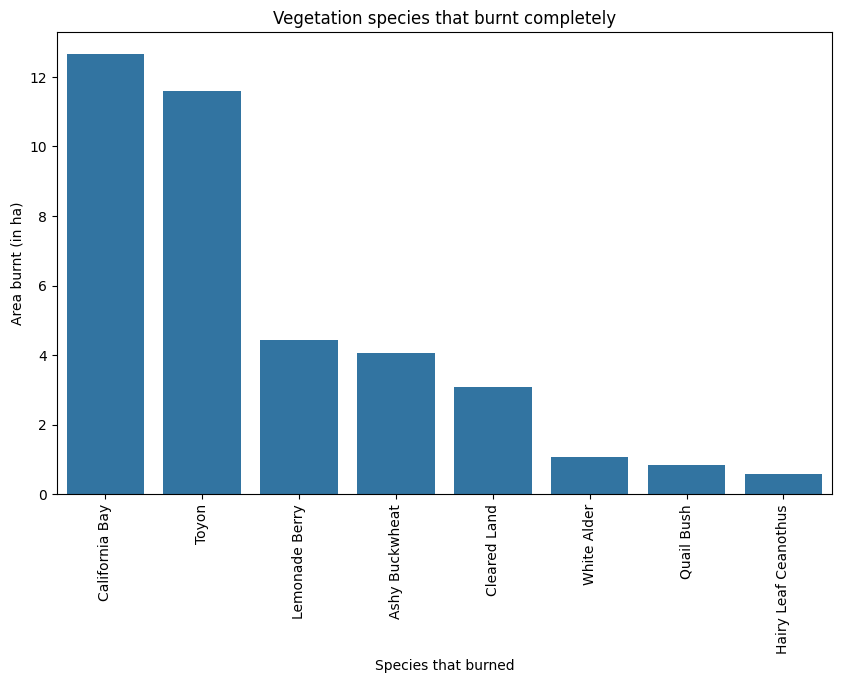

In [142]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# use the scatterplot() function
sns.barplot(
    x="Veg_name", # the x column
    y="Burnt_ha", # the y column
    data=species_thatburnedcompletely2,# pass in the data
    ax=ax
)

# Format with matplotlib commands
ax.set_xlabel("Species that burned")
ax.set_ylabel("Area burnt (in ha)")
ax.set_title("Vegetation species that burnt completely")
#ax.set_xticks(byseverity['Class_Cnam'][:20])
ax.set_xticklabels(species_thatburnedcompletely['Veg_name'], rotation=90)

In [143]:
df_wide

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt
index,,,,,
0,(California Walnut)/Undifferentiated Tall Shru...,54457.83,0.00,54457.83,1.00
42,Mexican Elderberry Shrubland Alliance,53714.76,0.00,53714.76,1.00
29,Coyote Brush Shrubland Alliance,85397.29,0.00,85397.29,1.00
1,Arroyo Willow Woodland/Forest Alliance,5175.84,0.00,5175.84,1.00
32,Fennel Herbaceous Alliance,10752.69,0.00,10752.69,1.00
...,...,...,...,...,...
25,Chamise-Black Sage Shrubland Alliance,179945.36,67477.00,247422.36,0.73
60,Water Mapping Unit,8739.09,28114.53,36853.62,0.24
55,Scrub Oak-Chamise Shrubland Alliance,21699.07,192079.11,213778.18,0.10


In [148]:
final_df = df_wide
final_df['Vegetation area in the 1km buffer'] = df_wide2['Total Area'] - df_wide['Total Area']
final_df['Vegetation area that burnt in the 1km buffer'] = df_wide2['Burnt'] - df_wide['Burnt']
final_df['Vegetation area that did not burnt in the 1km buffer'] = df_wide2['Not Burnt'] - df_wide['Not Burnt']
final_df['Proportion of vegetation that burnt in the 1km buffer'] = final_df['Vegetation area that burnt in the 1km buffer'] / final_df['Vegetation area in the 1km buffer']
final_df = final_df.sort_values('Proportion of area that burnt', ascending=False)

In [149]:
final_df

dNBR_Classification,Class_Cnam,Burnt,Not Burnt,Total Area,Proportion of area that burnt,Vegetation area in the 1km buffer,Vegetation area that burnt in the 1km buffer,Vegetation area that did not burnt in the 1km buffer,Proportion of trees that burnt in the 1km buffer,Proportion of vegetation that burnt in the 1km buffer
index,,,,,,,,,,
0,(California Walnut)/Undifferentiated Tall Shru...,54457.83,0.00,54457.83,1.00,33956.67,0.00,33956.67,0.00,0.00
42,Mexican Elderberry Shrubland Alliance,53714.76,0.00,53714.76,1.00,-13087.98,-13087.98,0.00,1.00,1.00
15,California Bay Woodland/Forest Alliance,1592251.88,0.00,1592251.88,1.00,15401737.87,13439515.32,1962222.55,0.87,0.87
5,Big Berry Manzanita Shrubland Alliance,30852.92,0.00,30852.92,1.00,945757.77,83314.76,862443.01,0.09,0.09
3,Ashy Buckwheat Shrubland Alliance,363647.79,0.00,363647.79,1.00,1847268.68,546707.51,1300561.18,0.30,0.30
...,...,...,...,...,...,...,...,...,...,...
25,Chamise-Black Sage Shrubland Alliance,179945.36,67477.00,247422.36,0.73,4759611.86,3081573.44,1678038.42,0.65,0.65
60,Water Mapping Unit,8739.09,28114.53,36853.62,0.24,1655075.13,1001856.89,653218.24,0.61,0.61
55,Scrub Oak-Chamise Shrubland Alliance,21699.07,192079.11,213778.18,0.10,-205465.35,-13386.25,-192079.11,0.07,0.07


## Area calculations by severity

In [154]:
veg_withburn['dNBR_Classification'].value_counts()

,count
dNBR_Classification,
Burnt,3658
Not Burnt,239


In [153]:
veg_onlyburn = veg_withburn[veg_withburn['dNBR_Classification'] == 'Burnt']
veg_onlyburn

,system:index,AAdb_ID,Class_Abbr,Class_Cnam,Class_Snam,Density,LU_Code,LU_Text,Map_Class,OBJECTID,Shape_Area,Shape_Length,UTDensity,clipped_area,median,.geo,area_diff,BurnSeverity,dNBR_Classification
0,00000000000000002456,samo2298,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,48666,54104.37,3934.20,9,54131.01,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.540814...",-26.63,2,Burnt
1,00000000000000002539,samo2635,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,48991,21036.52,1037.34,9,21053.67,4.00,"{""type"":""Polygon"",""coordinates"":[[[-118.595287...",-17.15,4,Burnt
2,00000000000000002566,samo2687,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,49044,5602.80,505.27,9,5608.00,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.639310...",-5.20,2,Burnt
3,00000000000000002651,NaN,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,7,28037.67,1553.05,9,28082.75,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.568817...",-45.08,2,Burnt
4,00000000000000002652,NaN,Umb cal,California Bay Woodland/Forest Alliance,Umbellularia californica Woodland/Forest Alliance,1,3100,Vacant Undifferentiated,10100,9,5308.17,395.13,9,5317.65,2.00,"{""type"":""Polygon"",""coordinates"":[[[-118.556288...",-9.49,2,Burnt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3892,00000000000000001fbb,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47076,30926.98,1886.14,9,30939.25,4.00,"{""type"":""Polygon"",""coordinates"":[[[-118.524206...",-12.27,4,Burnt
3893,00000000000000001fc3,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47085,17616.55,1367.12,9,17617.42,4.00,"{""type"":""Polygon"",""coordinates"":[[[-118.511771...",-0.87,4,Burnt
3894,00000000000000001fc4,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47086,6993.11,625.45,9,6994.08,4.00,"{""type"":""Polygon"",""coordinates"":[[[-118.528604...",-0.97,4,Burnt
3895,00000000000000001fc7,NaN,Firebreak MU,Firebreak Early Seral Undifferentiated Vegetat...,Firebreak Early Seral Undifferentiated Vegetat...,4,3100,Vacant Undifferentiated,97000,47090,9874.56,776.88,9,9847.90,5.00,"{""type"":""Polygon"",""coordinates"":[[[-118.537262...",26.65,4,Burnt


In [159]:
species_severity = veg_onlyburn.groupby(['Class_Cnam','BurnSeverity'])['clipped_area'].sum().reset_index()
species_severity = species_severity.rename(columns={'clipped_area':'Burnt Area'})
species_severity

,Class_Cnam,BurnSeverity,Burnt Area
0,(California Walnut)/Undifferentiated Tall Shru...,1,34846.73
1,(California Walnut)/Undifferentiated Tall Shru...,2,19611.09
2,Arroyo Willow Woodland/Forest Alliance,4,5175.84
3,Artificial cuts/Embankments Undifferentiated V...,1,90916.43
4,Artificial cuts/Embankments Undifferentiated V...,2,231056.19
...,...,...,...
165,White Alder Woodland/Forest Alliance,3,117164.22
166,Willow Woodland/Forest Superalliance,1,82099.48
167,Willow Woodland/Forest Superalliance,2,44778.44
168,Willow Woodland/Forest Superalliance,3,34407.73


In [158]:
total_area_species = veg_withburn.groupby(['Class_Cnam'])['clipped_area'].sum().reset_index()
total_area_species = total_area_species.rename(columns={'clipped_area':'Total Area'})
total_area_species

,Class_Cnam,Total Area
0,(California Walnut)/Undifferentiated Tall Shru...,54457.83
1,Arroyo Willow Woodland/Forest Alliance,5175.84
2,Artificial cuts/Embankments Undifferentiated V...,1042773.45
3,Ashy Buckwheat Shrubland Alliance,363647.79
4,Beach Sand Mapping Unit,919191.28
...,...,...
58,Urban/Disturbed or Built-up Undifferentiated M...,18259563.48
59,Valley Oak Woodland/Forest Alliance,590100.47
60,Water Mapping Unit,36853.62
61,White Alder Woodland/Forest Alliance,136740.05


In [162]:
species_severity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170 entries, 0 to 169
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Class_Cnam    170 non-null    object 
 1   BurnSeverity  170 non-null    int64  
 2   Burnt Area    170 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 4.1+ KB


In [163]:
combined_df = species_severity.merge(total_area_species, on = 'Class_Cnam')
combined_df

,Class_Cnam,BurnSeverity,Burnt Area,Total Area
0,(California Walnut)/Undifferentiated Tall Shru...,1,34846.73,54457.83
1,(California Walnut)/Undifferentiated Tall Shru...,2,19611.09,54457.83
2,Arroyo Willow Woodland/Forest Alliance,4,5175.84,5175.84
3,Artificial cuts/Embankments Undifferentiated V...,1,90916.43,1042773.45
4,Artificial cuts/Embankments Undifferentiated V...,2,231056.19,1042773.45
...,...,...,...,...
165,White Alder Woodland/Forest Alliance,3,117164.22,136740.05
166,Willow Woodland/Forest Superalliance,1,82099.48,233129.91
167,Willow Woodland/Forest Superalliance,2,44778.44,233129.91
168,Willow Woodland/Forest Superalliance,3,34407.73,233129.91


In [164]:
combined_df['Proportion_of_burn'] = combined_df['Burnt Area']/combined_df['Total Area']
combined_df

,Class_Cnam,BurnSeverity,Burnt Area,Total Area,Proportion_of_burn
0,(California Walnut)/Undifferentiated Tall Shru...,1,34846.73,54457.83,0.64
1,(California Walnut)/Undifferentiated Tall Shru...,2,19611.09,54457.83,0.36
2,Arroyo Willow Woodland/Forest Alliance,4,5175.84,5175.84,1.00
3,Artificial cuts/Embankments Undifferentiated V...,1,90916.43,1042773.45,0.09
4,Artificial cuts/Embankments Undifferentiated V...,2,231056.19,1042773.45,0.22
...,...,...,...,...,...
165,White Alder Woodland/Forest Alliance,3,117164.22,136740.05,0.86
166,Willow Woodland/Forest Superalliance,1,82099.48,233129.91,0.35
167,Willow Woodland/Forest Superalliance,2,44778.44,233129.91,0.19
168,Willow Woodland/Forest Superalliance,3,34407.73,233129.91,0.15


In [168]:
combined_df = combined_df.sort_values(by=['BurnSeverity', 'Proportion_of_burn'], ascending=[True, False])
combined_df

,Class_Cnam,BurnSeverity,Burnt Area,Total Area,Proportion_of_burn
143,Scrub Oak Shrubland Alliance,1,60164.79,63950.76,0.94
18,Big Pod Ceanothus and Greenbark Ceanothus and ...,1,786570.83,889452.21,0.88
20,Birch Leaf Mountain Mahogany Shrubland Alliance,1,1000411.51,1207807.90,0.83
0,(California Walnut)/Undifferentiated Tall Shru...,1,34846.73,54457.83,0.64
74,Chamise-Eastwood Manzanita Shrubland Alliance,1,317778.40,535060.65,0.59
...,...,...,...,...,...
69,Chamise Shrubland Alliance,4,156098.64,3288059.77,0.05
118,Lemonade Berry Shrubland Alliance,4,16315.27,452325.73,0.04
105,Greenbark Ceanothus Shrubland Alliance,4,451941.83,16436519.90,0.03
17,Big Pod Ceanothus Shrubland Alliance,4,581540.18,27572546.47,0.02
